# Capstone Project

**Overview**: Goal of the project is to answer the question - Given Spotify's collection of metadata about artists and their tracks, is it possible to predict which of the artists songs will be among their top 5 most popular?

#### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.preprocessing import StandardScaler, OneHotEncoder,OrdinalEncoder
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.compose import make_column_transformer,make_column_selector
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import precision_score, accuracy_score, recall_score, f1_score, classification_report, make_scorer, confusion_matrix
from sklearn.datasets import load_wine
import warnings 
warnings.simplefilter(action='ignore', category=FutureWarning)

### Gather Data

#### Data Sources
Spotify provides an API with metadata about artists and tracks including most popular tracks by artist, along with  track details like energy, danceability, key, etc. 
The data is available here via public API: https://developer.spotify.com/documentation/web-api/reference/#/operations/get-several-audio-features

#### Spotify Developer Dashboard - https://developer.spotify.com/dashboard/applications

In [2]:
#Install Python Library to interact with Spotify API - https://spotipy.readthedocs.io/en/2.22.1/
!pip install spotipy

### Create Dataset of Track features from Artists that are in the Rock and Roll Hall of Fame

#### Rock Hall of Fame Members listed in: rockhall.members.txt - Scraped from https://en.wikipedia.org/wiki/List_of_Rock_and_Roll_Hall_of_Fame_inductees
[compiled text file with Rock Hall Members](rockhall.members.txt)

#### The dataset includes 50 tracks for each Artist from the list

#### **This cell takes about 30 Minutes to generate a new list and requires a valid Client Id and Secret**

In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
#Connect to Spotify
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="5562af9a69b74d1ba11868bdfc38cf31",
                                                           client_secret="XXXXe3cec4740409b097c116dda7956"))#needs to be updated
df = pd.DataFrame()
tracks_df = pd.DataFrame()

#Determine List of Artists to Search for
#https://en.wikipedia.org/wiki/List_of_Rock_and_Roll_Hall_of_Fame_inductees - 
#Use this for testing -> artists_list = ['Radiohead','Weezer','Rod Stewart','The Beatles','Eagles','The Beach Boys','The Rolling Stones']

artists_list = pd.read_csv('rockhall.members.txt', sep = ';',squeeze = True)

#For each artist in the list
for artist_name in artists_list:
    #Debug - print(artist_name)
    #Search Spotify for matching artists by name (limit to first one found)
    results = sp.search(q='artist:' + artist_name, type='artist',market='US',limit=1)
    items = results['artists']['items']
    if len(items) > 0:
        artist = items[0]
       
        #Search Spotify for 50 top tracks for that Artist
        top_tracks = sp.search(q='artist:' + artist['name'],type='track',market='US',limit=50)

        #For each Track, list the track name, URI, and popularity score
        for idx, track in enumerate(top_tracks['tracks']['items']):
            #Debug - print(idx, track['name'],track['uri'],track['popularity'])
            
            #Get the track's audio features from Spotify
            features = sp.audio_features(track['uri'])
            #Debug - print(json.dumps(features, indent=4))
            
            #Add track features to the tracks dataframe
            if features[0]:
                features_df = pd.DataFrame(features).set_index('uri')
                track_df = pd.DataFrame({'Artist':artist['name'],'Track':track['name'],'Popularity':track['popularity']},index={track['uri']})
                track_features_df = pd.concat([track_df,features_df],axis=1)
                tracks_df = tracks_df.append(track_features_df) 

#Write track details out to file
tracks_df.to_csv('out.csv',index=True,index_label='uri')        

### Read Dataset of Track features from file created above or an existing file

In [3]:
all_tracks_df = pd.read_csv('out.all.top50.csv', sep = ',')

In [4]:
# Dropped Tracks by the Artist 'The Animals' and 'The Crickets' because thes included tracks not by the Rock bands 'The Animals' or 'The Crickets'
all_tracks_df = all_tracks_df[all_tracks_df.Artist != 'The Animals']
all_tracks_df = all_tracks_df[all_tracks_df.Artist != 'The Crickets']

In [5]:
#Preview Track data
all_tracks_df.head()

,uri,Artist,Track,Popularity,danceability,energy,key,loudness,mode,speechiness,...,instrumentalness,liveness,valence,tempo,type,id,track_href,analysis_url,duration_ms,time_signature
0,spotify:track:5haXbSJqjjM0TCJ5XkfEaC,James Brown,I Got You (I Feel Good),68,0.613,0.487,7,-8.781,1,0.0935,...,0.000010,0.2860,0.699,143.332,audio_features,5haXbSJqjjM0TCJ5XkfEaC,https://api.spotify.com/v1/tracks/5haXbSJqjjM0...,https://api.spotify.com/v1/audio-analysis/5haX...,165800,4
1,spotify:track:7bFfjakySYhojqSPrAPtc3,James Brown,Try Me,54,0.676,0.224,0,-15.193,1,0.0293,...,0.000000,0.3020,0.665,101.470,audio_features,7bFfjakySYhojqSPrAPtc3,https://api.spotify.com/v1/tracks/7bFfjakySYho...,https://api.spotify.com/v1/audio-analysis/7bFf...,153707,3
2,spotify:track:5XeSAezNDk9tuw3viiCbZ3,James Brown,Get Up Offa That Thing,57,0.864,0.813,2,-6.909,1,0.3610,...,0.000000,0.8740,0.720,118.006,audio_features,5XeSAezNDk9tuw3viiCbZ3,https://api.spotify.com/v1/tracks/5XeSAezNDk9t...,https://api.spotify.com/v1/audio-analysis/5XeS...,239733,4
3,spotify:track:00pGV4EInVd77cnOIwPTCv,James Brown,Papa's Got A Brand New Bag,51,0.738,0.541,4,-9.508,1,0.0900,...,0.000012,0.0861,0.925,127.942,audio_features,00pGV4EInVd77cnOIwPTCv,https://api.spotify.com/v1/tracks/00pGV4EInVd7...,https://api.spotify.com/v1/audio-analysis/00pG...,128173,4
4,spotify:track:5OcyX5eg7VrJuI833qOCUc,James Brown,The Payback,54,0.868,0.644,6,-10.987,1,0.1940,...,0.000180,0.9010,0.785,97.933,audio_features,5OcyX5eg7VrJuI833qOCUc,https://api.spotify.com/v1/tracks/5OcyX5eg7VrJ...,https://api.spotify.com/v1/audio-analysis/5Ocy...,459893,4


In [6]:
#Review available columns
all_tracks_df.columns

Index(['uri', 'Artist', 'Track', 'Popularity', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'type', 'id', 'track_href',
       'analysis_url', 'duration_ms', 'time_signature'],
      dtype='object')

### Dataset Description

Source: https://developer.spotify.com/documentation/web-api/reference/#/operations/get-track

popularity:  integer <br>
The popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are.
Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past. Duplicate tracks (e.g. the same track from a single and an album) are rated independently. Artist and album popularity is derived mathematically from track popularity. Note: the popularity value may lag actual popularity by a few days: the value is not updated in real time.

Source: https://developer.spotify.com/documentation/web-api/reference/#/operations/get-several-audio-features

acousticness: number <float> <br>
A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic. >= 0 <= 1

analysis_url: string <br>
A URL to access the full audio analysis of this track. An access token is required to access this data.

danceability: number <float> <br>
Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity.
A value of 0.0 is least danceable and 1.0 is most danceable.

duration_ms: integer <br>
The duration of the track in milliseconds.

energy: number <float> <br>
Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy,
while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.

id: string <br>
The Spotify ID for the track.

instrumentalness: number <float> <br>
Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

key: integer <br>
The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1. >= -1 <= 11

liveness: number <float> <br>
Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.

loudness: number <float> <br>
The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typically range between -60 and 0 db.

mode: integer 
Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

speechiness: number <float> <br>
Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.

tempo: number <float> <br>
The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.

time_signature: integer <br>
An estimated time signature. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). The time signature ranges from 3 to 7 indicating time signatures of "3/4", to "7/4". >= 3 <= 7

track_href: string <br>
A link to the Web API endpoint providing full details of the track.

type: string <br>
The object type.

uri: string <br>
The Spotify URI for the track.
 
valence: number <float> <br>
A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry). >= 0 <= 1


#### Identify columns with missing values

In [7]:
all_tracks_df.isna().any()

uri                 False
Artist              False
Track               False
Popularity          False
danceability        False
energy              False
key                 False
loudness            False
mode                False
speechiness         False
acousticness        False
instrumentalness    False
liveness            False
valence             False
tempo               False
type                False
id                  False
track_href          False
analysis_url        False
duration_ms         False
time_signature      False
dtype: bool

##### Analysis: No Tracks are missing values

#### Determine data types and non-null rows for each column along with whether they are numerical or categorical

In [8]:
all_tracks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11898 entries, 0 to 11995
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   uri               11898 non-null  object 
 1   Artist            11898 non-null  object 
 2   Track             11898 non-null  object 
 3   Popularity        11898 non-null  int64  
 4   danceability      11898 non-null  float64
 5   energy            11898 non-null  float64
 6   key               11898 non-null  int64  
 7   loudness          11898 non-null  float64
 8   mode              11898 non-null  int64  
 9   speechiness       11898 non-null  float64
 10  acousticness      11898 non-null  float64
 11  instrumentalness  11898 non-null  float64
 12  liveness          11898 non-null  float64
 13  valence           11898 non-null  float64
 14  tempo             11898 non-null  float64
 15  type              11898 non-null  object 
 16  id                11898 non-null  object

In [9]:
numerical_columns_selector = make_column_selector(dtype_exclude=object)
categorical_columns_selector = make_column_selector(dtype_include=object)

numerical_columns = numerical_columns_selector(all_tracks_df)
categorical_columns = categorical_columns_selector(all_tracks_df)
print (f'Numerical Columns: {numerical_columns}')
print (f'Categorical Columns: {categorical_columns}')

Numerical Columns: ['Popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'time_signature']
Categorical Columns: ['uri', 'Artist', 'Track', 'type', 'id', 'track_href', 'analysis_url']


#### Note: Although key, mode, and time_signature are numerical values, they are likely better interpreted as categorical variables. Mode is already binary encoded. Key does represent a value in Hz(cycles/second) however keys are not generally considered greater than or less than one another. Similarly, time_signature does reprepresent a number of beats however the difference is more of a style than an increase when considered for analyzing music. 

#### Explore Relationship of Numerical Columns

In [10]:
all_tracks_corr = all_tracks_df[numerical_columns].corr()
print(all_tracks_corr)

                  Popularity  danceability    energy       key  loudness  \
Popularity          1.000000      0.070914  0.116872  0.017017  0.094083   
danceability        0.070914      1.000000  0.102666  0.010820  0.074299   
energy              0.116872      0.102666  1.000000  0.039415  0.739124   
key                 0.017017      0.010820  0.039415  1.000000  0.037817   
loudness            0.094083      0.074299  0.739124  0.037817  1.000000   
mode               -0.043477     -0.062025 -0.043499 -0.132474 -0.007848   
speechiness         0.042467      0.166129  0.165943  0.040539  0.080427   
acousticness       -0.193728     -0.121763 -0.634187 -0.033786 -0.419537   
instrumentalness   -0.072616     -0.105699 -0.039247  0.013801 -0.175941   
liveness           -0.061825     -0.158365  0.156098 -0.014690  0.090130   
valence            -0.062523      0.486737  0.379631  0.015247  0.209926   
tempo               0.013998     -0.194543  0.183127  0.022127  0.107601   
duration_ms 

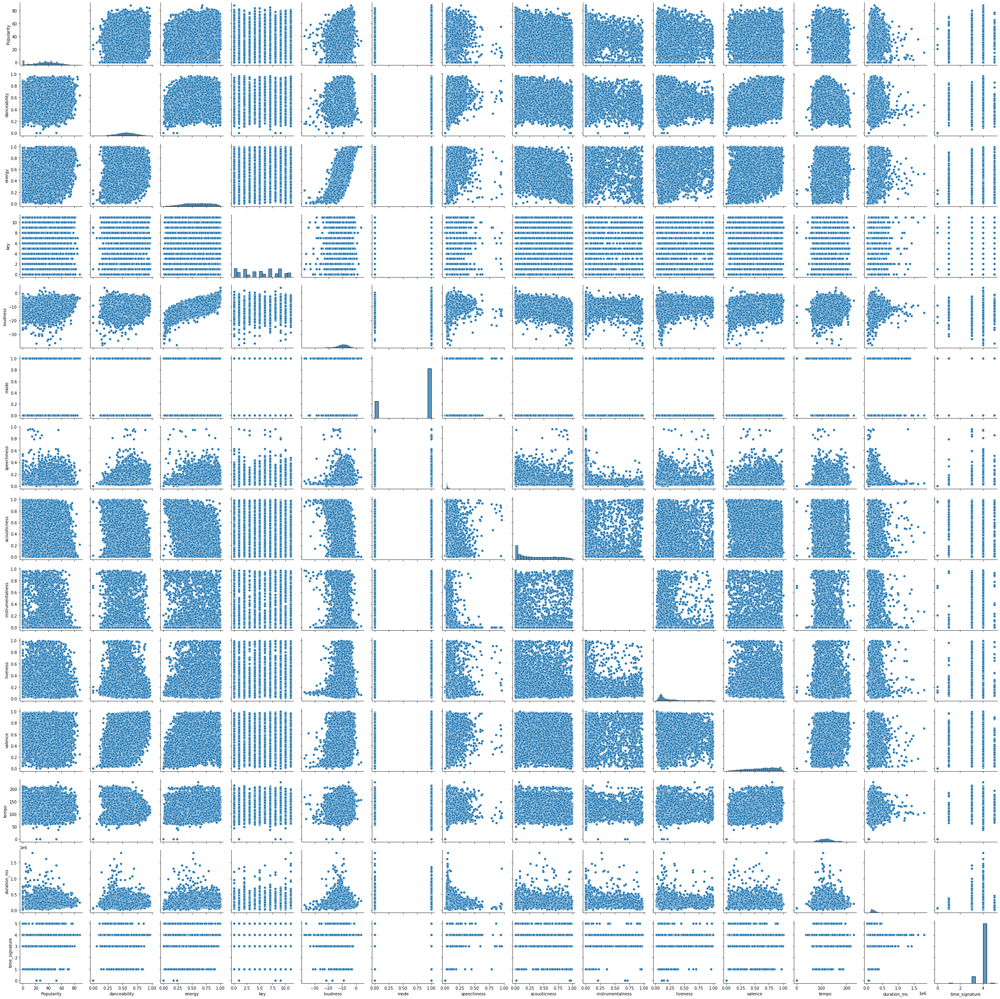

In [11]:
sns.pairplot(all_tracks_df)
plt.show()

<AxesSubplot:>

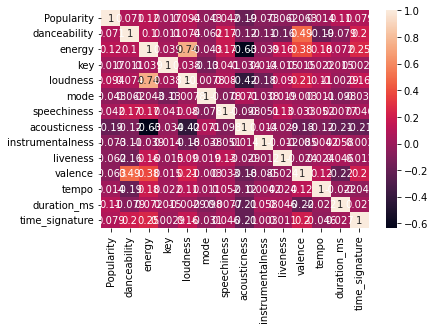

In [12]:
sns.heatmap(all_tracks_corr,annot=True)

##### Analysis:
* Loudness and Energy are the most highly correlated: 0.74
* Energy and Acousticneess are highly correlated: -0.63
* Danceability and Valence are moderately correlated:0.49
* Acousticness and Loudness are moderately correlated: -0.42
* Energy and Valence are moderately correlated:0.38


### Explore the Values of the Features

#### The number of unique values for each feature are as follows:

In [13]:
all_tracks_df.nunique()

uri                 11701
Artist                238
Track                9327
Popularity             87
danceability          803
energy               1065
key                    12
loudness             7596
mode                    2
speechiness          1086
acousticness         2515
instrumentalness     3761
liveness             1476
valence              1032
tempo               10457
type                    1
id                  11701
track_href          11701
analysis_url        11701
duration_ms          8571
time_signature          5
dtype: int64

#### The unique values for each feature with a relatively small number of unique values are:

In [14]:
for col in all_tracks_df[all_tracks_df.columns[[3,6,8,20]]]:
  print(col, all_tracks_df[col].unique())

Popularity [68 54 57 51 58 60 45 52 44 50 42 53  1  0 55 46 41 39 48 34 40 38 35 32
 43 67 62 66 56 47 37 36 30 31 61 63 64 59 49 33 29 28 25 23 27 22 20 24
 21 19 17 16 26 18 15 76 69 71 70 13 12 11  9 10  8 14  7 72 65 78  6  5
  2  4  3 73 74 75 79 80 81 77 82 83 88 84 85]
key [ 7  0  2  4  6  1  3 10  8  5  9 11]
mode [1 0]
time_signature [4 3 5 1 0]


#### Exploration of Popularity

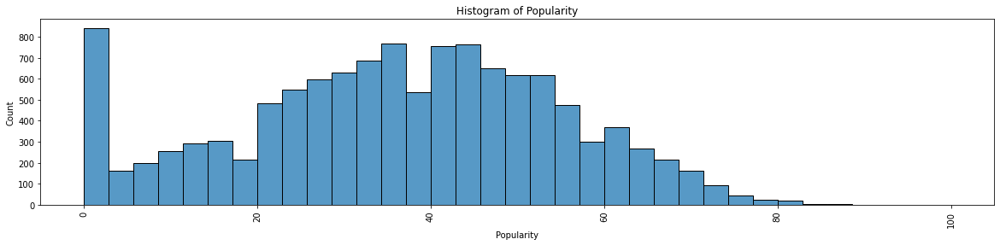

In [15]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'Popularity',bins=35,binrange=(0,100),ax=ax)
ax.set_title("Histogram of Popularity")
ax.set_ylabel("Count")
ax.set_xlabel("Popularity")
ax.tick_params(axis='x', rotation=90)
plt.show()

##### Note: The 0 popularity scoree are often for additional versions of a song which also has other versions with higher scores.

##### Exploration of Dancibility

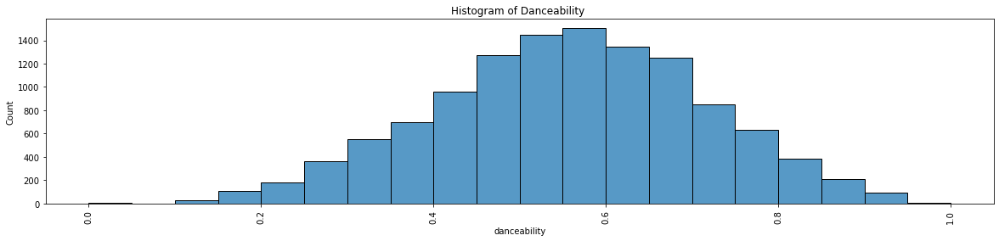

In [16]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'danceability',bins=20,binrange=(0,1),ax=ax)
ax.set_title("Histogram of Danceability ")
ax.set_ylabel("Count")
ax.set_xlabel("danceability")
ax.tick_params(axis='x', rotation=90)
plt.show()

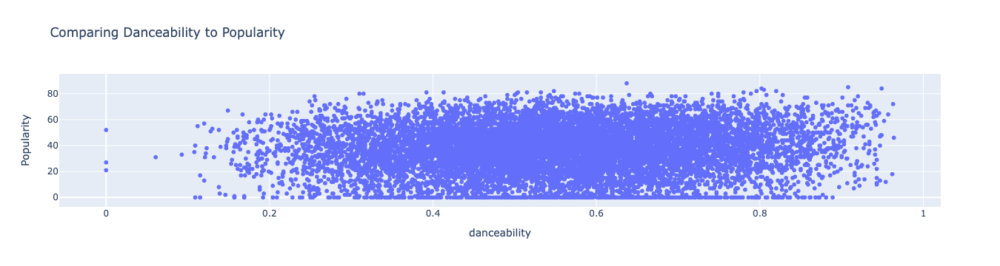

In [17]:
fig = px.scatter(data_frame=all_tracks_df, x='danceability', y='Popularity',title="Comparing Danceability to Popularity")
fig.show()

##### Analysis: For danceability > 0.2 popularity varies across the range of possibilities

In [18]:
print(all_tracks_df[all_tracks_df.danceability ==0][['Artist','Track']].head(10))

                  Artist                                              Track
3628            Al Green  Prince Igor: Polovtsian Dances (Remastered): N...
10193  Steve Miller Band                              Electro Lux Imbroglio
10229             Eloise                                          Advantage


##### Exploration of Energy

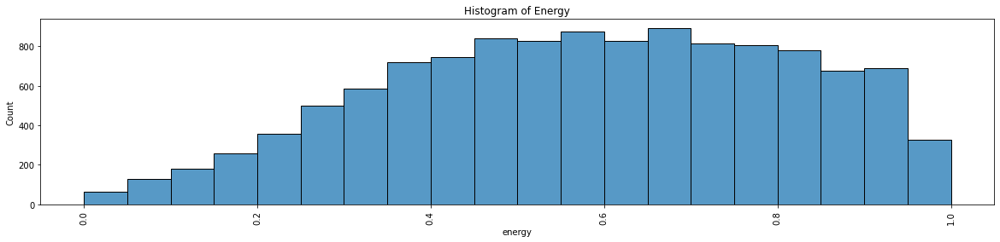

In [19]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'energy',bins=20,binrange=(0,1),ax=ax)
ax.set_title("Histogram of Energy")
ax.set_ylabel("Count")
ax.set_xlabel("energy")
ax.tick_params(axis='x', rotation=90)
plt.show()

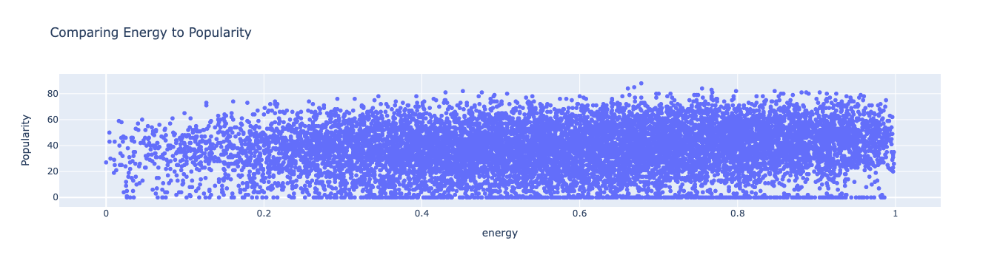

In [20]:
fig = px.scatter(data_frame=all_tracks_df, x='energy', y='Popularity',title="Comparing Energy to Popularity")
fig.show()

##### Analysis: popularity varies across the range of enegry values however the most popular songs tend to have energy ratings > 0.1

##### Exploration of key

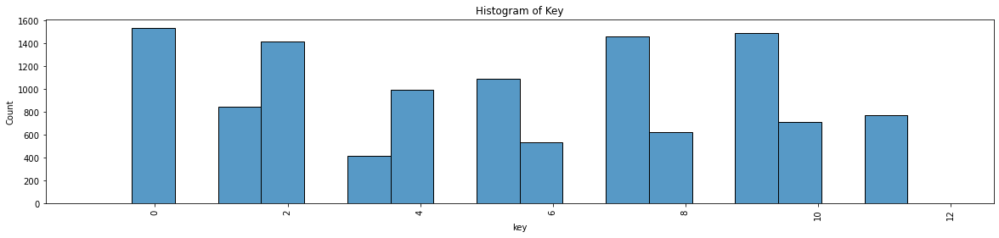

In [21]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'key',bins=20,binrange=(-1,12),ax=ax)
ax.set_title("Histogram of Key")
ax.set_ylabel("Count")
ax.set_xlabel("key")
ax.tick_params(axis='x', rotation=90)
plt.show()

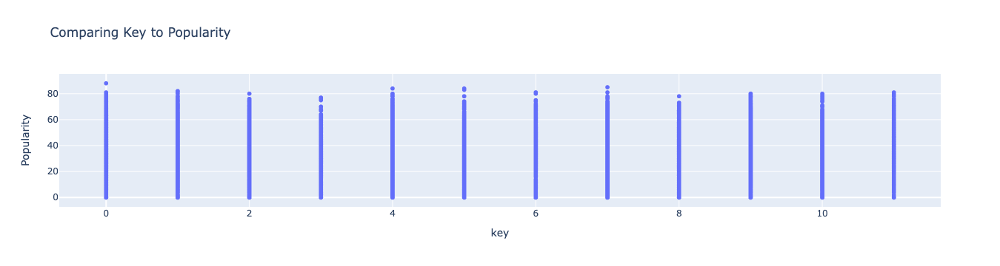

In [22]:
fig = px.scatter(data_frame=all_tracks_df, x='key', y='Popularity',title="Comparing Key to Popularity")
fig.show()

##### Analysis: the range of popularity occurs across across all musical keys

##### Exploration of loudness 

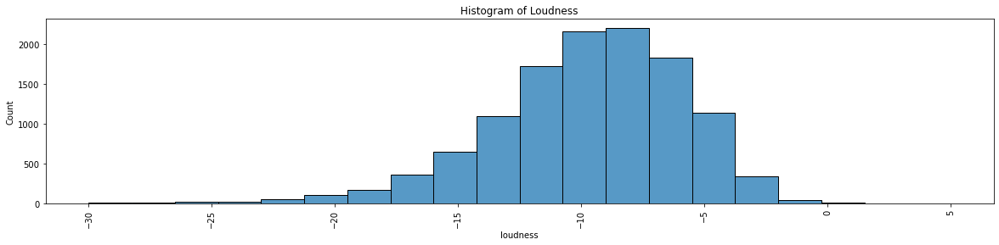

In [23]:
fig, ax = plt.subplots(figsize=(20,4))
sns.histplot(data = all_tracks_df,x = 'loudness',bins=20,binrange=(-30,5),ax=ax)
ax.set_title("Histogram of Loudness")
ax.set_ylabel("Count")
ax.set_xlabel("loudness")
ax.tick_params(axis='x', rotation=90)
plt.show()

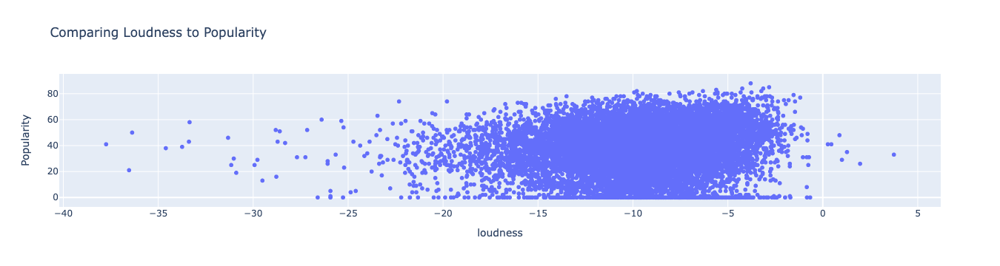

In [24]:
fig = px.scatter(data_frame=all_tracks_df, x='loudness', y='Popularity',title="Comparing Loudness to Popularity")
fig.show()

##### Analysis: the range of popularity occurs across across all loudness values > -25. For Values < -25 tend to be in the middle popularity scores

In [25]:
print(all_tracks_df[all_tracks_df.loudness < -30][['Artist','Track']].head(10))

                  Artist                                Track
1142        Muddy Waters                   Cold Weather Blues
1767         Bobby Darin        What a Difference a Day Makes
2046   Simon & Garfunkel                       Bookends Theme
2805              creamy  Dark Focus 220 Hz Q 1.10 - Seamless
4114          Pink Floyd                          Speak to Me
10038            Chicago                           Pink Noise
10053        Deep Purple                          Purple Star
10222             Eloise                   Trecroft Peninsula
10226             Eloise                  The Adamantine Isle
10339            Journey                   Moons in the Rings


##### Exploration of mode

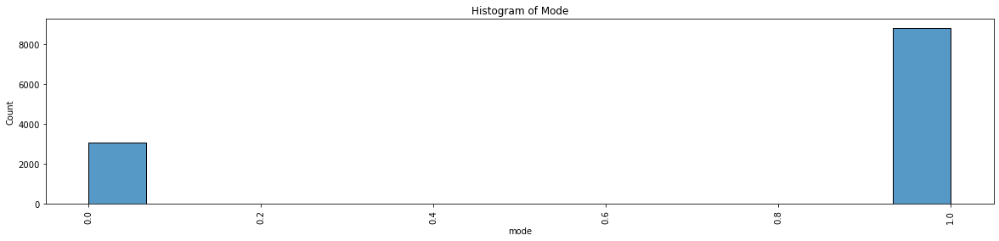

In [26]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'mode',binrange=(0,1),ax=ax)
ax.set_title("Histogram of Mode")
ax.set_ylabel("Count")
ax.set_xlabel("mode")
ax.tick_params(axis='x', rotation=90)
plt.show()

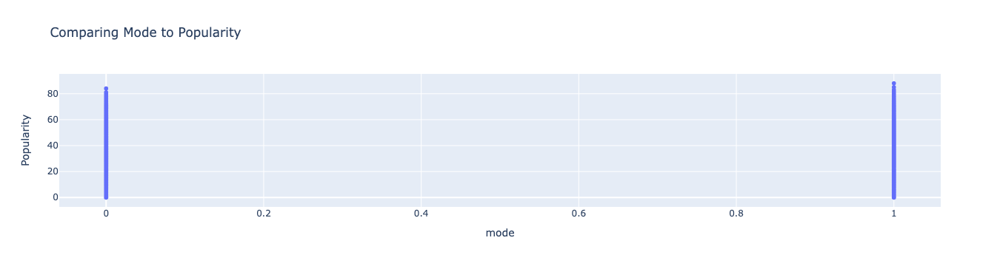

In [27]:
fig = px.scatter(data_frame=all_tracks_df, x='mode', y='Popularity',title="Comparing Mode to Popularity")
fig.show()

##### Analysis: the range of popularity occurs across across both major and minor key songs

##### Exploration of speechiness

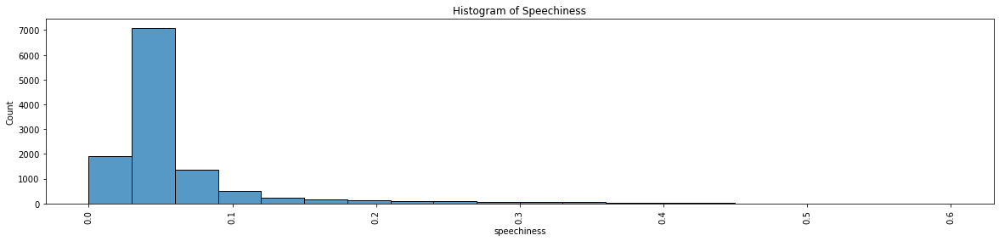

In [28]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'speechiness',bins=20,binrange=(0,0.6),ax=ax)
ax.set_title("Histogram of Speechiness")
ax.set_ylabel("Count")
ax.set_xlabel("speechiness")
ax.tick_params(axis='x', rotation=90)
plt.show()

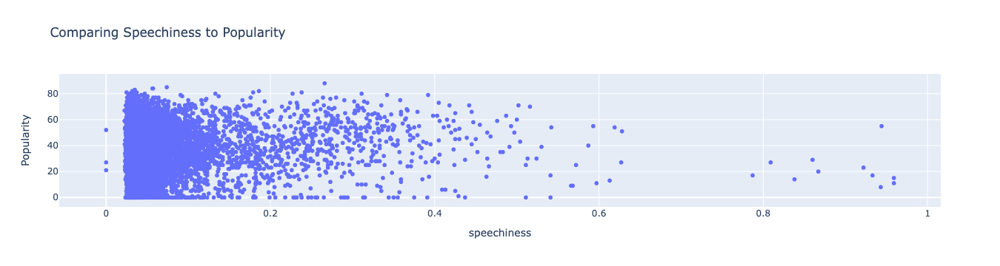

In [29]:
fig = px.scatter(data_frame=all_tracks_df, x='speechiness', y='Popularity',title="Comparing Speechiness to Popularity")
fig.show()

##### Analysis: the range of popularity occurs across across all speechiness values < 0.4. From dataset description: Values below 0.33 most likely represent music and other non-speech-like tracks. 

##### Exploration of acousticness

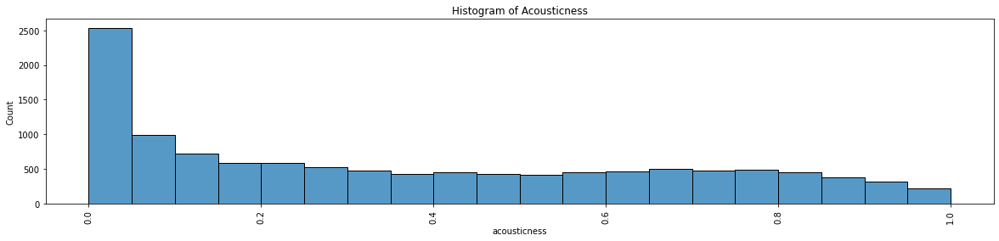

In [30]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'acousticness',bins=20,binrange=(0,1),ax=ax)
ax.set_title("Histogram of Acousticness")
ax.set_ylabel("Count")
ax.set_xlabel("acousticness")
ax.tick_params(axis='x', rotation=90)
plt.show()

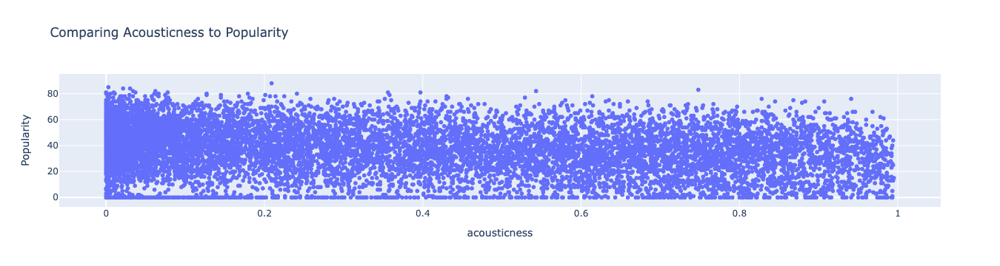

In [31]:
fig = px.scatter(data_frame=all_tracks_df, x='acousticness', y='Popularity',title="Comparing Acousticness to Popularity")
fig.show()

##### Analysis: the range of popularity occurs across almost the full range however the higly acoustic rated songs are not among the most popular for these artists

##### Exploration of instrumentalness

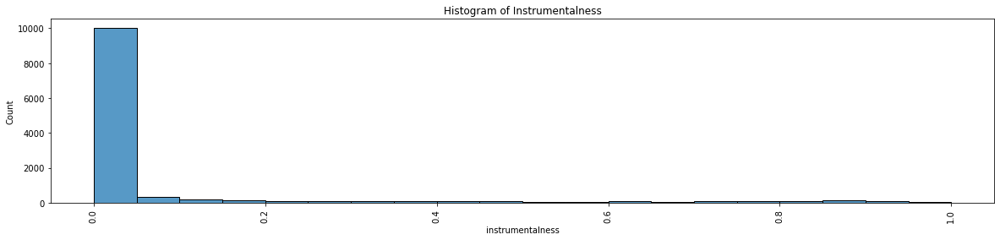

In [32]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'instrumentalness',bins=20,binrange=(0,1.0),ax=ax)
ax.set_title("Histogram of Instrumentalness")
ax.set_ylabel("Count")
ax.set_xlabel("instrumentalness")
ax.tick_params(axis='x', rotation=90)
plt.show()

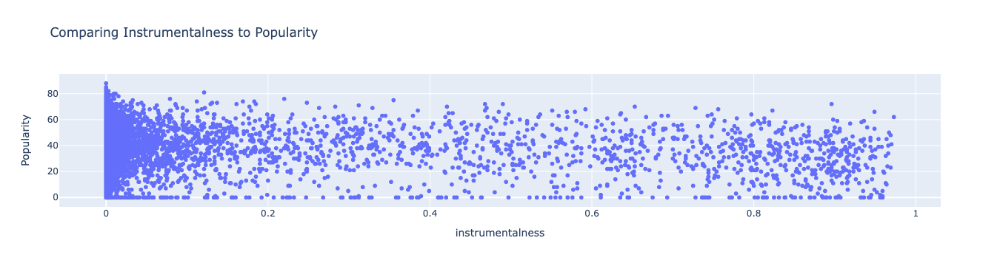

In [33]:
fig = px.scatter(data_frame=all_tracks_df, x='instrumentalness', y='Popularity',title="Comparing Instrumentalness to Popularity")
fig.show()

##### Analysis: the range of popularity occurs across the range of instrumentalness with majority of songs not being instrumental. The Dataset description says that songs > 0.5 are instrumental however I found exceptions in the data such as the Track "Eddie Cochran  Have I Told You Lately That I Love You" which was full of lyrics...

In [34]:
print(all_tracks_df[all_tracks_df.instrumentalness > 0.7][['Artist','Track']].head(10))

              Artist                                   Track
16       James Brown             Get On The Good Foot - Live
169      Fats Domino                             The Fat Man
182      Fats Domino                        Swanee River Hop
326  Jerry Lee Lewis               Boogie Woogie Country Man
360   Little Richard                                Richards
427    Elvis Presley                           Promised Land
479     The Coasters        Dreams under the moon - Acoustic
516    Eddie Cochran  Have I Told You Lately That I Love You
536    Eddie Cochran  Have I Told You Lately That I Love You
653      Marvin Gaye            Mercy Mercy Me (The Ecology)


##### Exploration of liveness 

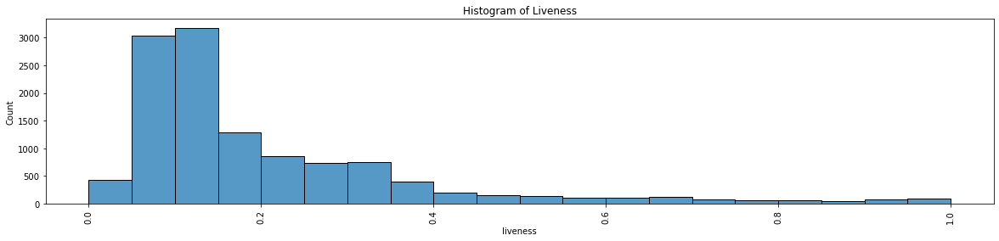

In [35]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'liveness',bins=20,binrange=(0,1),ax=ax)
ax.set_title("Histogram of Liveness")
ax.set_ylabel("Count")
ax.set_xlabel("liveness")
ax.tick_params(axis='x', rotation=90)
plt.show()

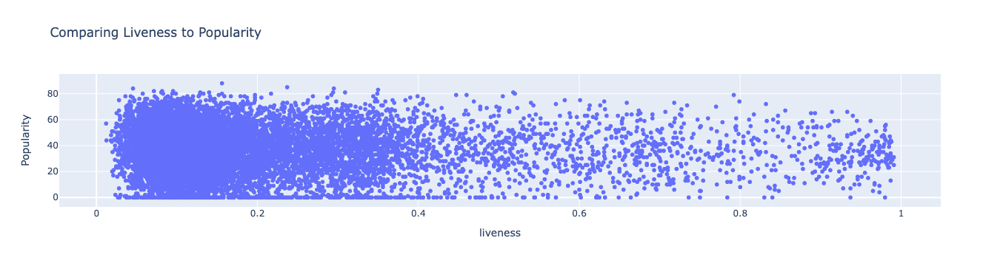

In [36]:
fig = px.scatter(data_frame=all_tracks_df, x='liveness', y='Popularity',title="Comparing Liveness to Popularity")
fig.show()

##### Analysis: the full range of popularity occurs for liveness values <= 0.8. Values > 0.8 tend to not be among the most popular

##### Exploration of valence

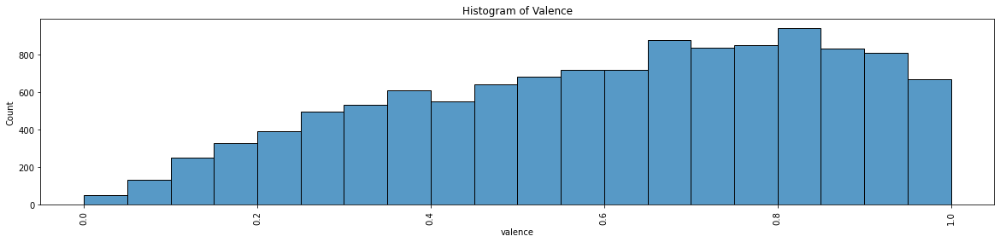

In [37]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'valence',bins=20,binrange=(0,1),ax=ax)
ax.set_title("Histogram of Valence")
ax.set_ylabel("Count")
ax.set_xlabel("valence")
ax.tick_params(axis='x', rotation=90)
plt.show()

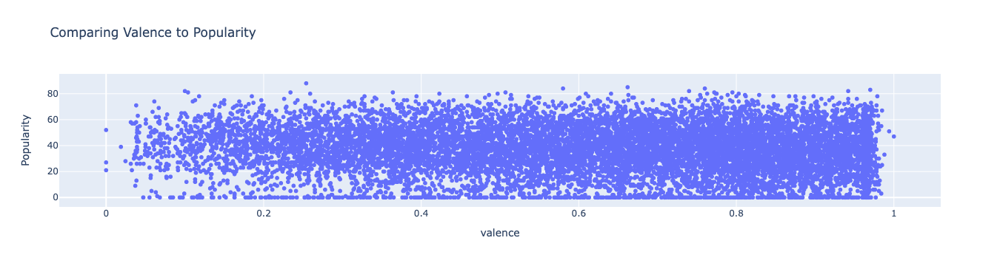

In [38]:
fig = px.scatter(data_frame=all_tracks_df, x='valence', y='Popularity',title="Comparing Valence to Popularity")
fig.show()

##### Analysis: the range of popularity occurs across the range of valence values except for the extreme values <0.0.5 and > .99

##### Exploration of tempo

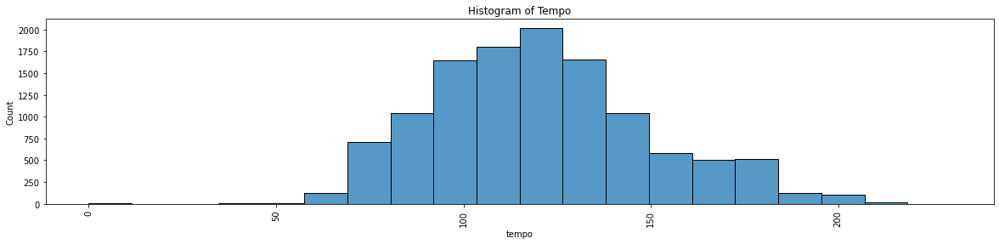

In [39]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'tempo',bins=20,binrange=(0,230),ax=ax)
ax.set_title("Histogram of Tempo")
ax.set_ylabel("Count")
ax.set_xlabel("tempo")
ax.tick_params(axis='x', rotation=90)
plt.show()

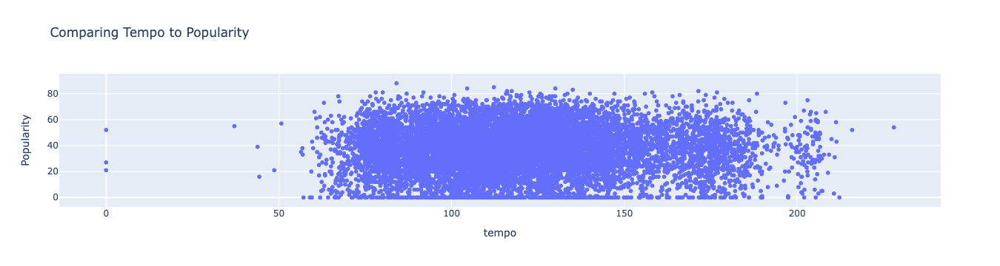

In [40]:
fig = px.scatter(data_frame=all_tracks_df, x='tempo', y='Popularity',title="Comparing Tempo to Popularity")
fig.show()

##### Analysis: most popular songs have tempos between 60 and 205 BPM

##### Exploration of duration_ms

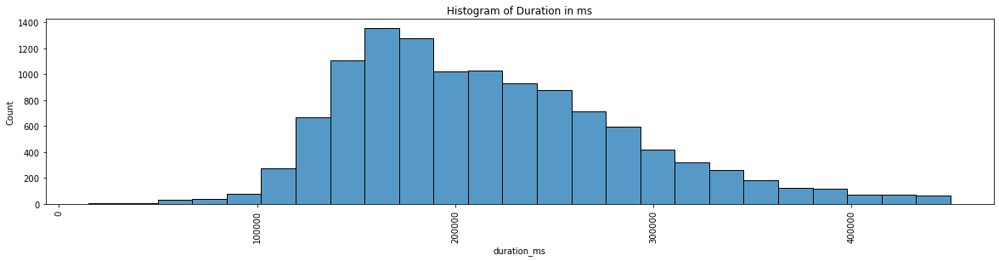

In [41]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'duration_ms',bins=25,binrange=(15000,450000),ax=ax)
ax.set_title("Histogram of Duration in ms")
ax.set_ylabel("Count")
ax.set_xlabel("duration_ms")
ax.tick_params(axis='x', rotation=90)
plt.show()

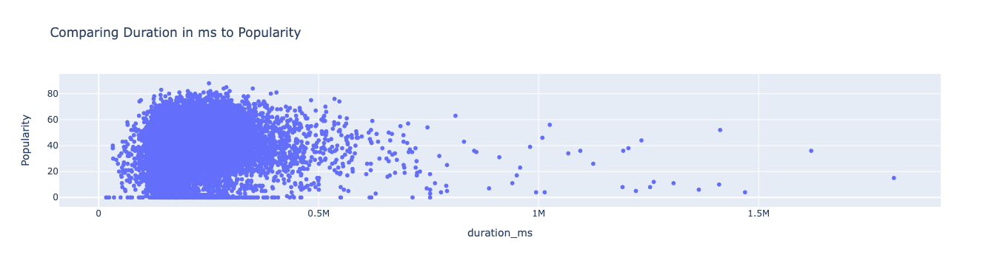

In [42]:
fig = px.scatter(data_frame=all_tracks_df, x='duration_ms', y='Popularity',title="Comparing Duration in ms to Popularity")
fig.show()

##### Analysis: most popular songs have duration between 80 and 480 secs (80k and 480K ms)
Tracks < 80 seconds are typically not full songs.

In [43]:
#Examples of tracks <80 seconds
print(all_tracks_df[all_tracks_df.duration_ms < 80000][['Artist','Track']].head(10))

                        Artist  \
2046         Simon & Garfunkel   
2097                   The Who   
2948                 The Doors   
3263                Duane Eddy   
3328     Grateful For The Dead   
3335     Grateful For The Dead   
3346     Grateful For The Dead   
3549  The Allman Brothers Band   
3628                  Al Green   
3671              Janis Joplin   

                                                  Track  
2046                                     Bookends Theme  
2097                                           Whoville  
2948  No Need for Introductions, I've Read About Gir...  
3263  The Trembler - From "Natural Born Killers" Sou...  
3328                 Radio Promo for Grateful Dead Live  
3335                      WB Commercial for Live / Dead  
3346                             3-Way Dueling Mow Mows  
3549     Bill Graham Intro - The Allman Brothers - Live  
3628  Prince Igor: Polovtsian Dances (Remastered): N...  
3671                                  "How 'B

##### Exploration of time_signature  

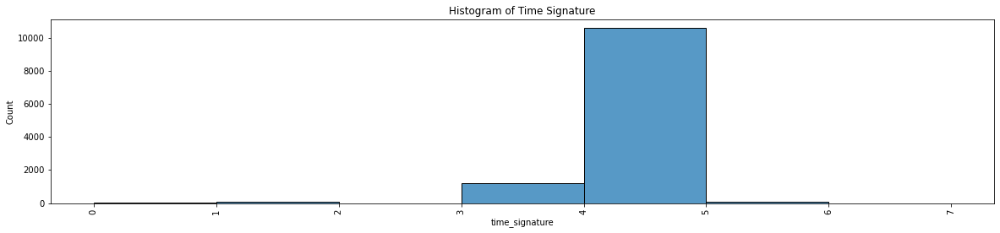

In [44]:
fig, ax = plt.subplots(figsize=(20, 4))
sns.histplot(data = all_tracks_df,x = 'time_signature',bins=7,binrange=(0,7),ax=ax)
ax.set_title("Histogram of Time Signature")
ax.set_ylabel("Count")
ax.set_xlabel("time_signature")
ax.tick_params(axis='x', rotation=90)
plt.show()

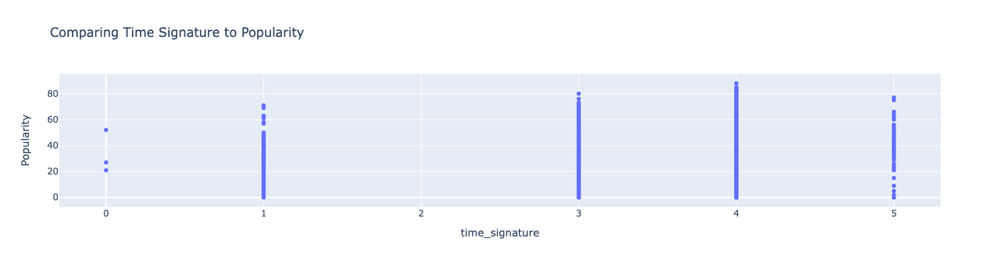

In [45]:
fig = px.scatter(data_frame=all_tracks_df, x='time_signature', y='Popularity',title="Comparing Time Signature to Popularity")
fig.show()

##### Analysis: the most popular songs are in 4/4 time.The values are supposed to range from 3-7 so 0 and 1 have unclear meaning. 

In [46]:
print(all_tracks_df[all_tracks_df.time_signature == 0][['Artist','Track']].head(10))

                  Artist                                              Track
3628            Al Green  Prince Igor: Polovtsian Dances (Remastered): N...
10193  Steve Miller Band                              Electro Lux Imbroglio
10229             Eloise                                          Advantage


In [47]:
print(all_tracks_df[all_tracks_df.time_signature == 1][['Artist','Track']].head(10))

              Artist                                              Track
458     The Coasters  Let's Go Get Stoned - 2007 Remaster Single Ver...
777        B.B. King                                          Guess Who
1189   Jackie Wilson                                          Danny Boy
1239  The Beach Boys              Heroes And Villains - Remastered 2001
1249  The Beach Boys                    Little Deuce Coupe - Remastered
1267     The Beatles    Lucy In The Sky With Diamonds - Remastered 2009
1315    The Drifters                                 There Goes My Baby
1381       Bob Dylan                     Make You Feel My Love - Take 1
1398       Bob Dylan                     Make You Feel My Love - Take 1
1399       Bob Dylan                                      Song to Woody


### Data Selection for modeling

#### Drop the following columns: uri, Track, id, track_href, analysis_url since they are not musical features of the track

In [48]:
clean_tracks_df = all_tracks_df.drop(['uri','type','id','track_href','analysis_url'],axis=1)

#### Drop the tracks that are not musical

In [49]:
clean_tracks_df = clean_tracks_df[clean_tracks_df.speechiness < 0.4]

#### Drop the tracks that are not full songs

In [50]:
clean_tracks_df = clean_tracks_df[clean_tracks_df.duration_ms > 80000]

#### Drop the tracks that have an invalid time signature 

In [51]:
clean_tracks_df = clean_tracks_df[clean_tracks_df.time_signature > 0]

#### Drop the tracks that have popularity <= 3 because these are usually additional copies of tracks.
For example The Police has several versions of Every Breath You Take at 0, while the most common version is at 82.

In [52]:
clean_tracks_df = clean_tracks_df[clean_tracks_df.Popularity >3]

### Feature Engineering for modeling

In [53]:
clean_tracks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10886 entries, 0 to 11995
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            10886 non-null  object 
 1   Track             10886 non-null  object 
 2   Popularity        10886 non-null  int64  
 3   danceability      10886 non-null  float64
 4   energy            10886 non-null  float64
 5   key               10886 non-null  int64  
 6   loudness          10886 non-null  float64
 7   mode              10886 non-null  int64  
 8   speechiness       10886 non-null  float64
 9   acousticness      10886 non-null  float64
 10  instrumentalness  10886 non-null  float64
 11  liveness          10886 non-null  float64
 12  valence           10886 non-null  float64
 13  tempo             10886 non-null  float64
 14  duration_ms       10886 non-null  int64  
 15  time_signature    10886 non-null  int64  
dtypes: float64(9), int64(5), object(2)
memor

#### Remove Duplicate Tracks - keeping the highest by popularity score

In [54]:
#Organize tracks in descending order of popularity
clean_tracks_df = clean_tracks_df.sort_values('Popularity',ascending=False)

In [55]:
#Drop Duplicate versions of tracks with lower popularity scores
clean_tracks_df = clean_tracks_df.drop_duplicates(subset=['Artist','Track'],keep='first',inplace=False,ignore_index=True)

In [56]:
#Test for duplicate removal
no_dup = clean_tracks_df[(clean_tracks_df['Artist'] =='The Police')]
#no_dup.head(50)

#### Identify Tracks as Top or 5 not for each artist

In [57]:
#Determine the Top 5 tracks for each artist
top5 = clean_tracks_df[clean_tracks_df.groupby('Artist')['Popularity'].rank(method='first', ascending=False) <= 5]

In [58]:
#Create a Dataframe for the Top 5 tracks of each artist and set Top5 column to 1 (True)
top5_tracks_df = top5.copy()
top5_tracks_df['Top5']=1
top5_tracks_df.info()
top5_tracks_df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1175 entries, 0 to 9184
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            1175 non-null   object 
 1   Track             1175 non-null   object 
 2   Popularity        1175 non-null   int64  
 3   danceability      1175 non-null   float64
 4   energy            1175 non-null   float64
 5   key               1175 non-null   int64  
 6   loudness          1175 non-null   float64
 7   mode              1175 non-null   int64  
 8   speechiness       1175 non-null   float64
 9   acousticness      1175 non-null   float64
 10  instrumentalness  1175 non-null   float64
 11  liveness          1175 non-null   float64
 12  valence           1175 non-null   float64
 13  tempo             1175 non-null   float64
 14  duration_ms       1175 non-null   int64  
 15  time_signature    1175 non-null   int64  
 16  Top5              1175 non-null   int64  


,Artist,Track,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Top5
0,Eminem,Mockingbird,88,0.637,0.678,0,-3.798,1,0.2660,0.20900,0.000000,0.1560,0.254,84.039,250760,4,1
1,Eminem,Without Me,85,0.908,0.669,7,-2.827,1,0.0738,0.00286,0.000000,0.2370,0.662,112.238,290320,4,1
2,Eminem,Superman,84,0.802,0.755,4,-3.138,0,0.0564,0.02150,0.000000,0.2950,0.580,130.027,350320,4,1
3,Eminem,The Real Slim Shady,84,0.949,0.661,5,-4.244,0,0.0572,0.03020,0.000000,0.0454,0.760,104.504,284200,4,1
4,Santana,Zona De Perigo,83,0.805,0.767,5,-5.612,1,0.0349,0.74800,0.000017,0.3500,0.970,135.060,142152,4,1


In [59]:
#Identify all tracks that are not in the Top5 of Popularity for the artist
not_top5 = clean_tracks_df[clean_tracks_df.groupby('Artist')['Popularity'].rank(method='first', ascending=False) > 5]

In [60]:
#Create a Dataframe for the Not Top 5 tracks of each artist and set Top5 column to 0 (False)
not_top5_tracks_df = not_top5.copy()
not_top5_tracks_df['Top5']=0
not_top5_tracks_df.info()
not_top5_tracks_df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8183 entries, 12 to 9357
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            8183 non-null   object 
 1   Track             8183 non-null   object 
 2   Popularity        8183 non-null   int64  
 3   danceability      8183 non-null   float64
 4   energy            8183 non-null   float64
 5   key               8183 non-null   int64  
 6   loudness          8183 non-null   float64
 7   mode              8183 non-null   int64  
 8   speechiness       8183 non-null   float64
 9   acousticness      8183 non-null   float64
 10  instrumentalness  8183 non-null   float64
 11  liveness          8183 non-null   float64
 12  valence           8183 non-null   float64
 13  tempo             8183 non-null   float64
 14  duration_ms       8183 non-null   int64  
 15  time_signature    8183 non-null   int64  
 16  Top5              8183 non-null   int64  

,Artist,Track,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Top5
12,Eminem,Stan,81,0.780,0.768,6,-4.325,0,0.238,0.0371,0.000002,0.5180,0.507,80.063,404107,4,0
21,Eminem,Love The Way You Lie,80,0.749,0.925,10,-5.034,1,0.227,0.2410,0.000000,0.5200,0.641,86.989,263373,4,0
26,Eminem,Godzilla (feat. Juice WRLD),79,0.808,0.745,10,-5.260,0,0.342,0.1450,0.000000,0.2920,0.829,165.995,210800,4,0
30,Eminem,Sing For The Moment,78,0.668,0.824,5,-4.164,0,0.137,0.0017,0.000003,0.0426,0.185,163.961,339547,4,0
54,Eminem,Not Afraid,77,0.855,0.954,0,-1.190,0,0.264,0.5290,0.000000,0.2050,0.668,114.635,248133,5,0


In [61]:
#Combine the Top5 and Not Top5 dataframes into one dataframe
all_tracks_final_df = top5_tracks_df.append([not_top5_tracks_df]) 

In [62]:
#Sort final dataframe by Artist and track popularity
all_tracks_final_df = all_tracks_final_df.sort_values(['Artist','Popularity'],ascending=False)
all_tracks_final_df.info()
#For debug - all_tracks_final_df.query('Artist == "Eminem"').head(60)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9358 entries, 2084 to 1764
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Artist            9358 non-null   object 
 1   Track             9358 non-null   object 
 2   Popularity        9358 non-null   int64  
 3   danceability      9358 non-null   float64
 4   energy            9358 non-null   float64
 5   key               9358 non-null   int64  
 6   loudness          9358 non-null   float64
 7   mode              9358 non-null   int64  
 8   speechiness       9358 non-null   float64
 9   acousticness      9358 non-null   float64
 10  instrumentalness  9358 non-null   float64
 11  liveness          9358 non-null   float64
 12  valence           9358 non-null   float64
 13  tempo             9358 non-null   float64
 14  duration_ms       9358 non-null   int64  
 15  time_signature    9358 non-null   int64  
 16  Top5              9358 non-null   int64

#### Scale numerical features that aren't already scaled to improve training

In [63]:
cols_to_scale = ['loudness','tempo','duration_ms']
scaler = StandardScaler()
all_tracks_final_df[cols_to_scale] = scaler.fit_transform(all_tracks_final_df[cols_to_scale])
#all_tracks_final_df.query('Artist == "Eminem"').head(10)

#### Encode Artist name for modeling 

In [64]:
ord_enc = OrdinalEncoder()
all_tracks_final_df['Artist'] = ord_enc.fit_transform(all_tracks_final_df[['Artist']])

#### One Hot Encode Key and Time Signature for modeling 

In [65]:
ohe = OneHotEncoder()
all_tracks_final_ohe_cols = all_tracks_final_df[['key','time_signature']]
ohe.fit(all_tracks_final_ohe_cols)
feature_names = ohe.get_feature_names(['key','time_signature'])
codes = ohe.transform(all_tracks_final_ohe_cols).toarray()

all_tracks_final_df = pd.concat([all_tracks_final_df,pd.DataFrame(codes,columns=feature_names).astype(int)], axis=1)

In [66]:
all_tracks_final_df.head(5)

,Artist,Track,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,...,key_6,key_7,key_8,key_9,key_10,key_11,time_signature_1,time_signature_3,time_signature_4,time_signature_5
2084,235.0,Tell Me Why I'm Waiting,53,0.760,0.207,11,-0.923313,0,0.0809,0.5230,...,0,0,0,0,0,0,0,0,1,0
2487,235.0,Past Lives (Acoustic),51,0.601,0.330,3,-0.919964,1,0.0336,0.9810,...,0,0,0,0,0,0,0,0,1,0
2977,235.0,Would You Be My Baby,48,0.802,0.294,1,-1.252757,1,0.0836,0.7470,...,0,0,0,0,0,0,0,1,0,0
3255,235.0,riptide,47,0.656,0.133,1,-2.648840,1,0.0420,0.9260,...,0,0,0,1,0,0,0,0,1,0
3433,235.0,sure thing,46,0.710,0.490,11,0.189174,0,0.1350,0.0258,...,1,0,0,0,0,0,0,0,1,0


### Model Training

#### Create Train & Test datasets

In [67]:
#generate train/test data excluding values not required for modeling 

#Balance Top5 classes by removing 80% of Not Top5 records
print(pd.value_counts(all_tracks_final_df['Top5']))
all_tracks_final_df = all_tracks_final_df.drop(all_tracks_final_df[all_tracks_final_df['Top5'] == 0].sample(frac=.80).index) #.80 drops 80% of the non-Top5 tracks
print(pd.value_counts(all_tracks_final_df['Top5']))


X = all_tracks_final_df.drop(['Track','Popularity','Top5','key','time_signature'],axis=1)
y = (all_tracks_final_df['Top5'])
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3,random_state=42,stratify=y)

0    8183
1    1175
Name: Top5, dtype: int64
0    1637
1    1175
Name: Top5, dtype: int64


#### A Baseline Model
Establish a baseline. The baseline performance that our classifier should aim to beat

In [68]:
start = time.time()
dummy_clf = DummyClassifier().fit(X_train,y_train)
end = time.time()
dummy_time = (end - start)

In [69]:
dummy_score_train = dummy_clf.score(X_train, y_train)
dummy_score_test = dummy_clf.score(X_test, y_test)
dummy_y_pred = dummy_clf.predict(X_test)
dummy_precision = precision_score(y_test,dummy_y_pred,pos_label=1,average='binary',zero_division=0)
dummy_recall = recall_score(y_test,dummy_y_pred,pos_label=1,average='binary')
dummy_f1 = f1_score(y_test,dummy_y_pred,pos_label=1,average='binary')

In [70]:
print("Baseline dummy model training time: {:.2f}".format(dummy_time))
print("Baseline dummy model training accuracy: {:.2f}".format(dummy_score_train))
print("Baseline dummy model test accuracy: {:.2f}".format(dummy_score_test))
print("Baseline dummy model test precision: {:.2f}".format(dummy_precision))
print("Baseline dummy model test recall: {:.2f}".format(dummy_recall))
print("Baseline dummy model F1 Score: {:.2f}".format(dummy_f1))


Baseline dummy model training time: 0.00
Baseline dummy model training accuracy: 0.58
Baseline dummy model test accuracy: 0.58
Baseline dummy model test precision: 0.00
Baseline dummy model test recall: 0.00
Baseline dummy model F1 Score: 0.00


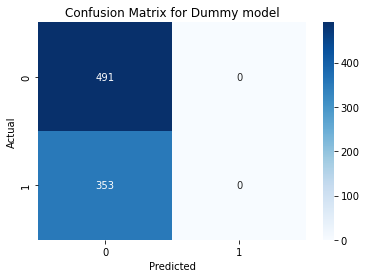

In [71]:
#Confusion Matrix for Dummy model
conf_matrix = confusion_matrix(y_test, dummy_y_pred)
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for Dummy model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

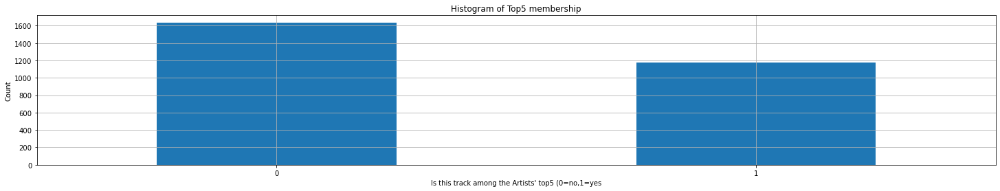

In [72]:
fig, ax = plt.subplots(figsize=(25, 4))
y.value_counts().plot(kind="bar")
ax.set_title("Histogram of Top5 membership")
ax.set_ylabel("Count")
ax.set_xlabel("Is this track among the Artists' top5 (0=no,1=yes")
ax.grid()
ax.tick_params(axis='x', rotation=0)
plt.show()

##### Analysis: The dummy baseline model has a relatively high accuracy since the dataset is imbalanced with much a higher proporation of rows indicating track is not part of the top5

#### A Simple Model using Logistic Regression

In [73]:
start = time.time()
lgr_clf = LogisticRegression(max_iter=10000).fit(X_train,y_train)
end = time.time()
lgr_time = (end - start)

In [74]:
lgr_score_train = lgr_clf.score(X_train,y_train)
lgr_score_test = lgr_clf.score(X_test,y_test)
lgr_y_pred = lgr_clf.predict(X_test)
lgr_precision = precision_score(y_test,lgr_y_pred,pos_label=1,average='binary',zero_division=0)
lgr_recall = recall_score(y_test,lgr_y_pred,pos_label=1,average='binary',zero_division=0)
lgr_f1 = f1_score(y_test,lgr_y_pred,pos_label=1,average='binary',zero_division=0)

In [75]:
print("Basic Logistic Regression model training time: {:.2f}".format(lgr_time))
print("Basic Logistic Regression model training accuracy: {:.2f}".format(lgr_score_train))
print("Basic Logistic Regression model test accuracy: {:.2f}".format(lgr_score_test))
print("Basic Logistic Regression model test precision: {:.2f}".format(lgr_precision))
print("Basic Logistic Regression model test recall: {:.2f}".format(lgr_recall))
print("Basic Logistic Regression model F1 Score: {:.2f}".format(lgr_f1))


Basic Logistic Regression model training time: 0.11
Basic Logistic Regression model training accuracy: 0.59
Basic Logistic Regression model test accuracy: 0.57
Basic Logistic Regression model test precision: 0.45
Basic Logistic Regression model test recall: 0.16
Basic Logistic Regression model F1 Score: 0.23


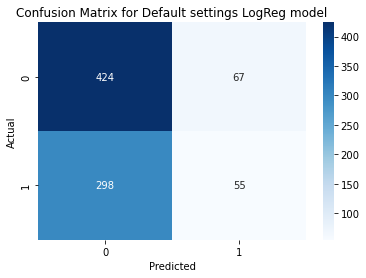

In [76]:
#Confusion Matrix for Default Settings LogReg model
conf_matrix = confusion_matrix(y_test, lgr_y_pred)
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for Default settings LogReg model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Addition Model Comparisons
Compare the performance of the Logistic Regression model to KNN algorithm, Decision Tree, and SVM models using the default settings for each of the models

#### Train and Score KNN with default settings model

In [77]:
start = time.time()
knn_clf = KNeighborsClassifier().fit(X_train,y_train)
end = time.time()
knn_time = (end - start)

In [78]:
knn_score_train = knn_clf.score(X_train,y_train)
knn_score_test = knn_clf.score(X_test,y_test)
knn_y_pred = knn_clf.predict(X_test)
knn_precision = precision_score(y_test,knn_y_pred,pos_label=1,average='binary',zero_division=0)
knn_recall = recall_score(y_test,knn_y_pred,pos_label=1,average='binary',zero_division=0)
knn_f1 = f1_score(y_test,knn_y_pred,pos_label=1,average='binary',zero_division=0)
print("Basic KNN model training time: {:.2f}".format(knn_time))
print("Basic KNN model training accuracy: {:.2f}".format(knn_score_train))
print("Basic KNN model test accuracy: {:.2f}".format(knn_score_test))
print("Basic KNN model test precision: {:.2f}".format(knn_precision))
print("Basic KNN model test recall: {:.2f}".format(knn_recall))
print("Basic KNN model test F1 Score: {:.2f}".format(knn_f1))

Basic KNN model training time: 0.00
Basic KNN model training accuracy: 0.68
Basic KNN model test accuracy: 0.46
Basic KNN model test precision: 0.34
Basic KNN model test recall: 0.30
Basic KNN model test F1 Score: 0.32


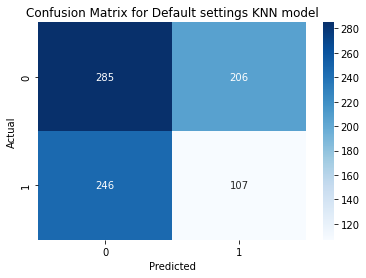

In [79]:
#Confusion Matrix for Default Settings KNN model
conf_matrix = confusion_matrix(y_test, knn_y_pred)
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for Default settings KNN model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Train and Score Decision Tree with default settings model

In [80]:
start = time.time()
dt_clf = DecisionTreeClassifier().fit(X_train,y_train)
end = time.time()
dt_time = (end - start)

In [81]:
dt_score_train = dt_clf.score(X_train,y_train)
dt_score_test = dt_clf.score(X_test,y_test)
dt_y_pred = dt_clf.predict(X_test)
dt_precision = precision_score(y_test,dt_y_pred,pos_label=1,average='binary',zero_division=0)
dt_recall = recall_score(y_test,dt_y_pred,pos_label=1,average='binary',zero_division=0)
dt_f1 = f1_score(y_test,dt_y_pred,pos_label=1,average='binary',zero_division=0)
print("Basic Decision Tree model training time: {:.2f}".format(dt_time))
print("Basic Decision Tree model training accuracy: {:.2f}".format(dt_score_train))
print("Basic Decision Tree model test accuracy: {:.2f}".format(dt_score_test))
print("Basic Decision Tree model test precision: {:.2f}".format(dt_precision))
print("Basic Decision Tree model test recall: {:.2f}".format(dt_recall))
print("Basic Decision Tree model test F1 Score: {:.2f}".format(dt_f1))

Basic Decision Tree model training time: 0.04
Basic Decision Tree model training accuracy: 1.00
Basic Decision Tree model test accuracy: 0.50
Basic Decision Tree model test precision: 0.41
Basic Decision Tree model test recall: 0.43
Basic Decision Tree model test F1 Score: 0.42


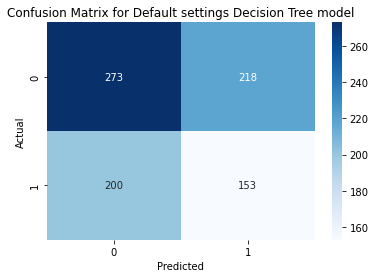

In [82]:
#Confusion Matrix for Default Settings Decision Tree model
conf_matrix = confusion_matrix(y_test, dt_y_pred )
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for Default settings Decision Tree model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Train and Score Support Vector Classification with default settings model

In [83]:
start = time.time()
svm_clf = SVC().fit(X_train,y_train)
end = time.time()
svm_time = (end - start)

In [84]:
svm_score_train = svm_clf.score(X_train,y_train)
svm_score_test = svm_clf.score(X_test,y_test)
svm_y_pred = svm_clf.predict(X_test)
svm_precision = precision_score(y_test,svm_y_pred,pos_label=1,average='binary',zero_division=0)
svm_recall = recall_score(y_test,svm_y_pred,pos_label=1,average='binary',zero_division=0)
svm_f1 = f1_score(y_test,svm_y_pred,pos_label=1,average='binary',zero_division=0)
print("Basic Support Vector Machine model training time: {:.2f}".format(svm_time))
print("Basic Support Vector Machine model training accuracy: {:.2f}".format(svm_score_train))
print("Basic Support Vector Machine model test accuracy: {:.2f}".format(svm_score_test))
print("Basic Support Vector Machine model test precision: {:.2f}".format(svm_precision))
print("Basic Support Vector Machine model test recall: {:.2f}".format(svm_recall))
print("Basic Support Vector Machine model test F1 Score: {:.2f}".format(svm_f1))

Basic Support Vector Machine model training time: 0.17
Basic Support Vector Machine model training accuracy: 0.58
Basic Support Vector Machine model test accuracy: 0.58
Basic Support Vector Machine model test precision: 0.00
Basic Support Vector Machine model test recall: 0.00
Basic Support Vector Machine model test F1 Score: 0.00


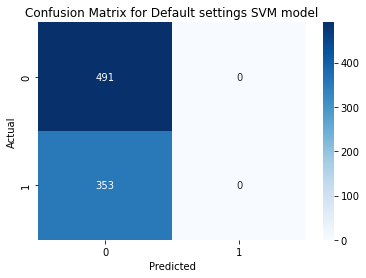

In [85]:
#Confusion Matrix for Default Settings SVM model
conf_matrix = confusion_matrix(y_test, svm_y_pred )
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for Default settings SVM model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#### Comparison of the training time and metrics of the basic models

In [86]:
basic_res_dict = {'Model': ['Baseline Dummy','Logistic Regression','KNN','Decision Tree', 'SVM'],
           'Train Time (secs)': [dummy_time, lgr_time, knn_time,dt_time,svm_time],
           'Train Accuracy': [dummy_score_train, lgr_score_train, knn_score_train,dt_score_train,svm_score_train],
           'Test Accuracy': [dummy_score_test, lgr_score_test,knn_score_test,dt_score_test,svm_score_test],
           'Precision': [dummy_precision, lgr_precision,knn_precision,dt_precision,svm_precision],
           'Recall': [dummy_recall, lgr_recall,knn_recall,dt_recall,svm_recall],
           'F1 Score': [dummy_f1, lgr_f1,knn_f1,dt_f1,svm_f1]}
basic_results_df = pd.DataFrame(basic_res_dict)
basic_results_df

,Model,Train Time (secs),Train Accuracy,Test Accuracy,Precision,Recall,F1 Score
0,Baseline Dummy,0.001565,0.582317,0.581754,0.000000,0.000000,0.000000
1,Logistic Regression,0.109468,0.588923,0.567536,0.450820,0.155807,0.231579
2,KNN,0.002729,0.681402,0.464455,0.341853,0.303116,0.321321
3,Decision Tree,0.036906,0.999492,0.504739,0.412399,0.433428,0.422652
4,SVM,0.171872,0.582317,0.581754,0.000000,0.000000,0.000000


#### Observations for basic models
- All of the basic models except SVM improve on Precision and Recall over the dummy model since it predicts not Top5 for everything.
- Accuracys are similar across model types.
- Decision Tree was the best overall model based on F1 score with both generally good Precision and Recall metrics.

#### Attempting to Improve on Basic Models

####  Added Hyperparameter tuning & cross fold validation using grid search to each model training

#### Optimizing for Precision since the business goal is to pick the tracks that are most likely to be in the Top5 and place less focus on those that are not.  


In [87]:
#Optimize for Precision
precision_scorer = make_scorer(precision_score, zero_division=0)
#Experiment with precision_scorer = make_scorer(recall_score) # or accuracy_score

##### Logistic Regression with HP Tuning

In [88]:
lgr_params = [{'solver': ['newton-cg','liblinear']},
              {'penalty':['l1', 'l2']},
              {'C':[0.001, 0.01, 0.1, 1, 10, 100]}]

In [89]:
logreg = LogisticRegression(max_iter=10000)
grid_lgr = GridSearchCV(logreg, param_grid = lgr_params,scoring=precision_scorer,cv=5).fit(X_train,y_train)
grid_lgr_y_pred = grid_lgr.predict(X_test)

grid_lgr_accuracy = accuracy_score(y_test,grid_lgr_y_pred)
grid_lgr_precision = precision_score(y_test,grid_lgr_y_pred,pos_label=1,average='binary',zero_division=0)
grid_lgr_recall = recall_score(y_test,grid_lgr_y_pred,pos_label=1,average='binary',zero_division=0)
grid_lgr_f1 = f1_score(y_test,grid_lgr_y_pred,pos_label=1,average='binary',zero_division=0)

print("Best Logistic Regression Accuracy: {:.2f}".format(grid_lgr_accuracy))
print("Best Logistic Regression Precision: {:.2f}".format(grid_lgr_precision))
print("Best Logistic Regression Recall: {:.2f}".format(grid_lgr_recall))
print("Best Logistic Regression F1: {:.2f}".format(grid_lgr_f1)) 
print("mean fit time :",np.mean(grid_lgr.cv_results_['mean_fit_time']))
print("Best Model:",grid_lgr.best_estimator_)
#Note  Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty warnings are expected and acceptable for a subset of trainings

Best Logistic Regression Accuracy: 0.57
Best Logistic Regression Precision: 0.45
Best Logistic Regression Recall: 0.16
Best Logistic Regression F1: 0.23
mean fit time : 0.05022208213806153
Best Model: LogisticRegression(max_iter=10000)


/Users/mikewalker/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning:


5 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/mikewalker/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/mikewalker/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/Users/mikewalker/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_

##### KNN with HP Tuning and optimized for Precision

In [90]:
knn_params = {'n_neighbors': [3,5,11,19,24,27],'weights':['uniform','distance'],'metric':['euclidean','manhattan']}

In [91]:
grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid=knn_params,scoring=precision_scorer,cv=5).fit(X_train, y_train)
grid_knn_y_pred = grid_knn.predict(X_test)

grid_knn_accuracy = accuracy_score(y_test,grid_knn_y_pred)
grid_knn_precision = precision_score(y_test,grid_knn_y_pred,pos_label=1,average='binary',zero_division=0)
grid_knn_recall = recall_score(y_test,grid_knn_y_pred,pos_label=1,average='binary',zero_division=0)
grid_knn_f1 = f1_score(y_test,grid_knn_y_pred,pos_label=1,average='binary',zero_division=0)

print("Best KNN Accuracy: {:.2f}".format(grid_knn_accuracy))
print("Best KNN Precision: {:.2f}".format(grid_knn_precision))
print("Best KNN Recall: {:.2f}".format(grid_knn_recall))
print("Best KNN F1: {:.2f}".format(grid_knn_f1)) 
print("mean fit time :",np.mean(grid_knn.cv_results_['mean_fit_time']))
print("Best Model:",grid_knn.best_estimator_)

Best KNN Accuracy: 0.49
Best KNN Precision: 0.39
Best KNN Recall: 0.37
Best KNN F1: 0.38
mean fit time : 0.0021096726258595785
Best Model: KNeighborsClassifier(metric='manhattan', n_neighbors=3)


##### Decision Tree with HP Tuning and optimized for Precision

In [92]:
dt_params = { 'criterion':['gini','entropy'],'max_depth': np.arange(2, 30)}

In [93]:
grid_dt = GridSearchCV(DecisionTreeClassifier(), param_grid=dt_params,scoring=precision_scorer,cv=5).fit(X_train, y_train)
grid_dt_y_pred = grid_dt.predict(X_test)

grid_dt_accuracy = accuracy_score(y_test,grid_dt_y_pred)
grid_dt_precision = precision_score(y_test,grid_dt_y_pred,pos_label=1,average='binary',zero_division=0)
grid_dt_recall = recall_score(y_test,grid_dt_y_pred,pos_label=1,average='binary',zero_division=0)
grid_dt_f1 = f1_score(y_test,grid_dt_y_pred,pos_label=1,average='binary',zero_division=0)

print("Best Decision Tree Accuracy: {:.2f}".format(grid_dt_accuracy))
print("Best Decision Tree Precision: {:.2f}".format(grid_dt_precision))
print("Best Decision Tree Recall: {:.2f}".format(grid_dt_recall))
print("Best Decision Tree F1: {:.2f}".format(grid_dt_f1)) 
print("mean fit time :",np.mean(grid_dt.cv_results_['mean_fit_time']))
print("Best Model:",grid_dt.best_estimator_)

Best Decision Tree Accuracy: 0.51
Best Decision Tree Precision: 0.41
Best Decision Tree Recall: 0.38
Best Decision Tree F1: 0.39
mean fit time : 0.01736769846507481
Best Model: DecisionTreeClassifier(max_depth=11)


##### Support Vector Machine Classifier with HP Tuning and optimized for Precision

In [ ]:
#Didn't use due to not being able to complete on my machine
#svc_params = {'kernel': ['rbf', 'poly', 'linear'],'gamma': [0.1, 1.0, 10.0],}

In [ ]:
#takes hours to run and best model has always been best gamma:0.1
svc_params = {'kernel': [ 'linear',],
         'gamma': [0.1,1.0,10.0],}

In [94]:
#used this based on prior runs
svc_params = {'kernel': [ 'linear'],
         'gamma': [0.1],}

In [95]:
svc = SVC()
grid_svc = GridSearchCV(svc, param_grid=svc_params,scoring=precision_scorer,cv=2,n_jobs=-1).fit(X_train, y_train)
grid_svc_y_pred = grid_svc.predict(X_test)

grid_svc_accuracy = accuracy_score(y_test,grid_svc_y_pred)
grid_svc_precision = precision_score(y_test,grid_svc_y_pred,pos_label=1,average='binary',zero_division=0)
grid_svc_recall = recall_score(y_test,grid_svc_y_pred,pos_label=1,average='binary',zero_division=0)
grid_svc_f1 = f1_score(y_test,grid_svc_y_pred,pos_label=1,average='binary',zero_division=0)

print("Best SVM Accuracy: {:.2f}".format(grid_svc_accuracy))
print("Best SVM Precision: {:.2f}".format(grid_svc_precision))
print("Best SVM Recall: {:.2f}".format(grid_svc_recall))
print("Best SVM F1: {:.2f}".format(grid_svc_f1)) 
print("mean fit time :",np.mean(grid_svc.cv_results_['mean_fit_time']))
print("Best Model:",grid_svc.best_estimator_)

Best SVM Accuracy: 0.58
Best SVM Precision: 0.00
Best SVM Recall: 0.00
Best SVM F1: 0.00
mean fit time : 15.535860061645508
Best Model: SVC(gamma=0.1, kernel='linear')


In [96]:
pd.set_option('display.width', 10000)

In [97]:
grid_res_dict = {'Model': ['Logistic Regression','KNN','Decision Tree', 'SVM'],
           'Mean Fit time (secs)': [np.mean(grid_lgr.cv_results_['mean_fit_time']), np.mean(grid_knn.cv_results_['mean_fit_time']) ,np.mean(grid_dt.cv_results_['mean_fit_time']),np.mean(grid_svc.cv_results_['mean_fit_time'])],
           'Accuracy': [grid_lgr_accuracy, grid_knn_accuracy, grid_dt_accuracy, grid_svc_accuracy],
           'Precision': [grid_lgr_precision, grid_knn_precision, grid_dt_precision, grid_svc_precision],
           'Recall': [grid_lgr_recall, grid_knn_recall, grid_dt_recall, grid_svc_recall],
           'F1 Score': [grid_lgr_f1, grid_knn_f1,grid_dt_f1, grid_svc_f1],      
           'Best Model Parameters': [grid_lgr.best_estimator_,grid_knn.best_estimator_,grid_dt.best_estimator_,grid_svc.best_estimator_]}
grid_results_df = pd.DataFrame(grid_res_dict)
pd.set_option('display.max_colwidth', None)
grid_results_df

,Model,Mean Fit time (secs),Accuracy,Precision,Recall,F1 Score,Best Model Parameters
0,Logistic Regression,0.050222,0.567536,0.450820,0.155807,0.231579,LogisticRegression(max_iter=10000)
1,KNN,0.002110,0.489336,0.385294,0.371105,0.378066,"KNeighborsClassifier(metric='manhattan', n_neighbors=3)"
2,Decision Tree,0.017368,0.513033,0.410494,0.376771,0.392910,DecisionTreeClassifier(max_depth=11)
3,SVM,15.535860,0.581754,0.000000,0.000000,0.000000,"SVC(gamma=0.1, kernel='linear')"


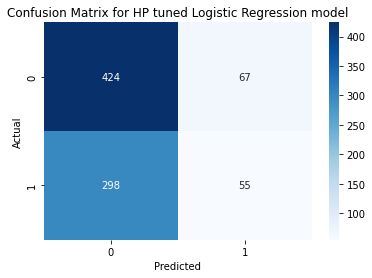

In [98]:
#Confusion Matrix for Logistic Regression model
conf_matrix = confusion_matrix(y_test, grid_lgr_y_pred)
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for HP tuned Logistic Regression model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

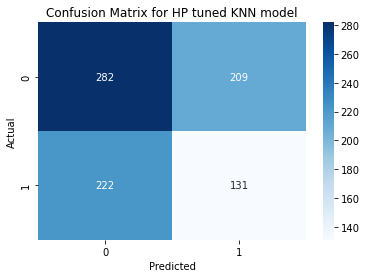

In [99]:
#Confusion Matrix for KNN model
conf_matrix = confusion_matrix(y_test, grid_knn_y_pred)
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for HP tuned KNN model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

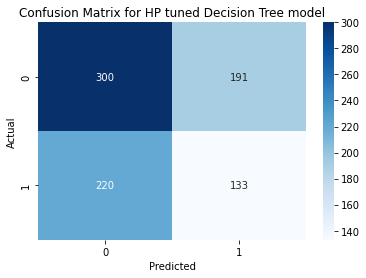

In [100]:
#Confusion Matrix for Decision Tree model
conf_matrix = confusion_matrix(y_test, grid_dt_y_pred)
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for HP tuned Decision Tree model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

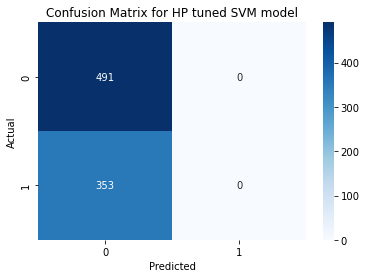

In [101]:
#Confusion Matrix for SVM model
conf_matrix = confusion_matrix(y_test, grid_svc_y_pred)
sns.heatmap(conf_matrix, annot = True, cmap = 'Blues', fmt = 'd')
plt.title('Confusion Matrix for HP tuned SVM model')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [102]:
#Save final dataset for futher exploration
all_tracks_final_df.to_csv('all_tracks_final.csv',index=True,index_label='uri')

#### Observations for the improved models

- the relationship between the training times is similar to the basic models 
- the model with the best precision was the Decision Tree.
- the LogisticRegression had the best Recall
- The HP tuned Decision Tree model did performed worse than the HP tuned Decision Tree model with default settings so more investigation is warranted.
- Potential next steps would be to:
-     A) obtain more data
-     B) try additional classes balancing
            - the above results are based on removed 80% of the non-Top5 scores
            - prior to the balancing classes, the Precision scores were around 0.10 so balancing greatly improved results
-     C) test eliminating highly correlated columns like energy and loudness
-     D) test removing columns to reduce potential overfitting
- The HP tuned SVM model training ran very long which prevented me from trying additional hyperparameter options